In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode, plot
init_notebook_mode(connected=True)

import random

from tsfresh.examples.robot_execution_failures import download_robot_execution_failures, load_robot_execution_failures
from tsfresh import extract_features, extract_relevant_features, select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh.feature_extraction import ComprehensiveFCParameters
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.svm import LinearSVC

# graphs

In [2]:
df_dup = pd.read_csv("vSocial_Dup.csv")
df_dup.head()

,No.,Time,Source,Destination,Protocol,Length,Info
0,1,0.000000,128.206.20.43,128.206.20.147,UDP,60,62656 > 53759 Len=8
1,2,0.000101,128.206.20.147,128.206.20.43,QUIC,132,"0-RTT, DCID=c7bfb77e, SCID=5e07fb0cad7c18ca4597e3"
2,3,0.000624,128.206.20.147,128.206.20.43,UDP,614,53759 > 49639 Len=572
3,4,0.001072,128.206.20.147,128.206.20.43,UDP,614,53759 > 49639 Len=572
4,5,0.002018,128.206.20.147,128.206.20.43,UDP,614,53759 > 49639 Len=572


In [3]:
df_norm = pd.read_csv("vSocial_Norm.csv")
df_norm.head()

,No.,Time,Source,Destination,Protocol,Length,Info
0,1,0.000000,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
1,2,0.010049,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
2,3,0.010950,128.206.20.43,128.206.20.147,UDP,82,59511 > 61938 Len=40
3,4,0.011395,128.206.20.43,128.206.20.147,UDP,629,49640 > 61938 Len=587
4,5,0.019369,128.206.20.147,128.206.20.43,UDP,572,61938 > 49640 Len=530


In [4]:
df_tamper = pd.read_csv("vSocial_Tamper.csv")
df_tamper.head()

,No.,Time,Source,Destination,Protocol,Length,Info
0,1,0.000000,128.206.20.147,128.206.20.43,UDP,132,60857 > 50477 Len=90
1,2,0.007616,128.206.20.43,128.206.20.147,UDP,82,50477 > 60857 Len=40
2,3,0.009956,128.206.20.147,128.206.20.43,UDP,132,60857 > 50477 Len=90
3,4,0.013629,128.206.20.43,128.206.20.147,UDP,257,49643 > 60857 Len=215
4,5,0.018363,128.206.20.43,128.206.20.147,UDP,82,50477 > 60857 Len=40


In [5]:
df_drop = pd.read_csv("vSocial_Drop.csv")
df_drop.head()

,No.,Time,Source,Destination,Protocol,Length,Info
0,1,0.000000,128.206.20.147,128.206.20.43,UDP,83,60857 > 55382 Len=41
1,2,0.000536,128.206.20.43,128.206.20.147,UDP,82,49636 > 60857 Len=40
2,3,0.001187,128.206.20.147,128.206.20.43,UDP,83,60857 > 49636 Len=41
3,4,0.002281,128.206.20.43,128.206.20.147,UDP,83,55382 > 60857 Len=41
4,5,0.003008,128.206.20.147,128.206.20.43,UDP,614,60857 > 49639 Len=572


In [6]:
df_norm

,No.,Time,Source,Destination,Protocol,Length,Info
0,1,0.000000,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
1,2,0.010049,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
2,3,0.010950,128.206.20.43,128.206.20.147,UDP,82,59511 > 61938 Len=40
3,4,0.011395,128.206.20.43,128.206.20.147,UDP,629,49640 > 61938 Len=587
4,5,0.019369,128.206.20.147,128.206.20.43,UDP,572,61938 > 49640 Len=530
5,6,0.019970,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
6,7,0.030049,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
7,8,0.040044,128.206.20.147,128.206.20.43,UDP,132,61938 > 59511 Len=90
8,9,0.042031,128.206.20.147,128.206.20.43,UDP,572,61938 > 49640 Len=530
9,10,0.042562,128.206.20.43,128.206.20.147,UDP,82,59511 > 61938 Len=40


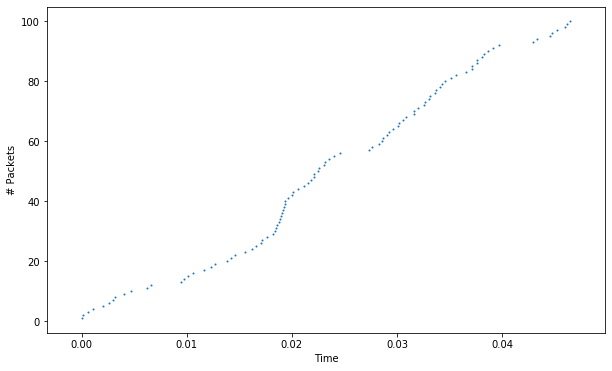

In [7]:
plt.figure(figsize=(10,6))
plt.scatter(list(df_dup.Time)[:100], list(df_dup["No."])[:100], s=1)
plt.xlabel("Time")
plt.ylabel("# Packets")
plt.show()

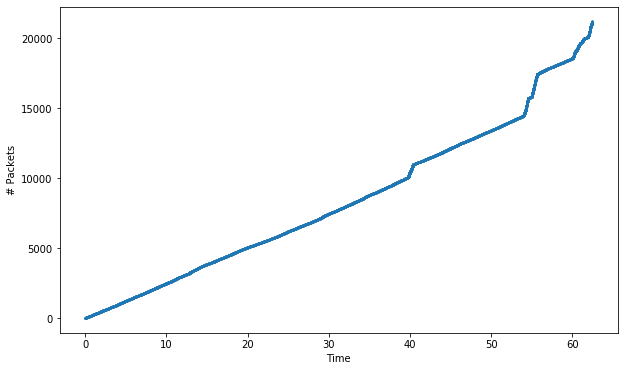

In [8]:
plt.figure(figsize=(10,6))
plt.scatter(list(df_norm.Time), list(df_norm["No."]), s=1)
plt.xlabel("Time")
plt.ylabel("# Packets")
plt.show()

In [9]:
data = [go.Scatter(
          x=list(df_dup.Time),
          y=list(df_dup['No.']))]

layout = dict(
    title='Time series with range slider and selectors',
    xaxis=dict(
        rangeslider=dict(
            visible = True
        )
    )
)

iplot(dict(data=data, layout=layout))

In [10]:
data = [go.Scatter(
          x=list(df_norm.Time),
          y=list(df_norm['No.']))]

layout = dict(
    title='Time Series of Packages Sent',
    xaxis=dict(
        rangeslider=dict(
            visible = True
        )
    )
)

iplot(dict(data=data, layout=layout))

In [11]:
def getPacketSpeeds(df):
    speedArray = []
    for i in range(0, 60):
        speedArray.append(len(df[(df.Time >= i) & (df.Time <= i+1)]))
    return speedArray

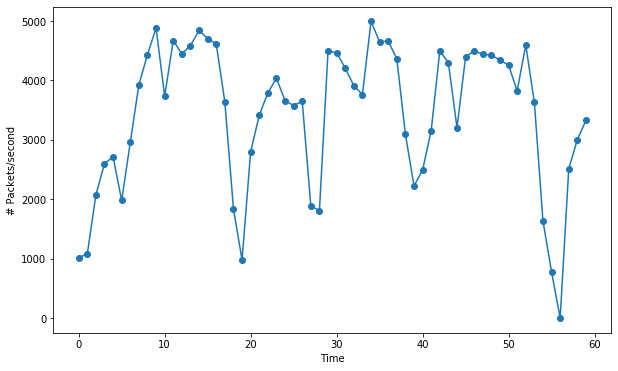

In [12]:
plt.figure(figsize=(10,6))
plt.plot(list(range(0,60)), getPacketSpeeds(df_dup), '-o')
plt.xlabel("Time")
plt.ylabel("# Packets/second")
plt.show()

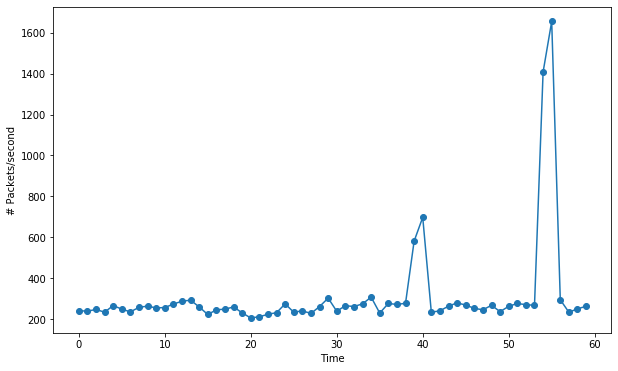

In [13]:
plt.figure(figsize=(10,6))
plt.plot(list(range(0,60)), getPacketSpeeds(df_norm), '-o')
plt.xlabel("Time")
plt.ylabel("# Packets/second")
plt.show()

In [14]:
def randomColor():
    (r,g,b) = [str(random.randint(1,255)), str(random.randint(1,255)), str(random.randint(1,255))]
    color = 'rgb(' + r + ','+ g + ',' + b + ')'
    return color

def updateVisibility(selected_type):
    visibilityValues = []
    for plot_datum in plot_data:
        if plot_datum['Type'] == selected_type:
            visibilityValues.append(True)
        else:
            visibilityValues.append(False)
    return visibilityValues

norm_total = {'x': list(df_norm.Time[df_norm.Time <= 60][0::50]), 'y': list(df_norm['No.'][0::50])}
dup_total = {'x': list(df_dup.Time[df_dup.Time <= 60][0::50]), 'y': list(df_dup['No.'][0::50])}
tamper_total = {'x': list(df_tamper.Time[df_tamper.Time <= 60][0::50]), 'y': list(df_tamper['No.'][0::50])}
drop_total = {'x': list(df_drop.Time[df_drop.Time <= 60][0::50]), 'y': list(df_drop['No.'][0::50])}

norm_speed = {'x': list(range(0,60)), 'y': getPacketSpeeds(df_norm)}
dup_speed = {'x': list(range(0,60)), 'y': getPacketSpeeds(df_dup)}
tamper_speed = {'x': list(range(0,60)), 'y': getPacketSpeeds(df_tamper)}
drop_speed = {'x': list(range(0,60)), 'y': getPacketSpeeds(df_drop)}

data = []
buttons_data = []
buttons_labels = ["Total Packets Sent", "Packet Speed"]
plot_data = [{"Title": "No Manipulation", "Type": "Total Packets Sent", "Data": norm_total, "Color": "rgb(77, 82, 91)"}, 
             {"Title": "Duplication", "Type": "Total Packets Sent", "Data": dup_total, "Color": "rgb(104, 156, 249)"}, 
             {"Title": "Tampering", "Type": "Total Packets Sent", "Data": tamper_total, "Color": "rgb(249, 104, 104)"}, 
             {"Title": "Dropping", "Type": "Total Packets Sent", "Data": drop_total, "Color": "rgb(104, 249, 133)"},
             {"Title": "No Manipulation", "Type": "Packet Speed", "Data": norm_speed, "Color": "rgb(77, 82, 91)"}, 
             {"Title": "Duplication", "Type": "Packet Speed", "Data": dup_speed, "Color": "rgb(104, 156, 249)"}, 
             {"Title": "Tampering", "Type": "Packet Speed", "Data": tamper_speed, "Color": "rgb(249, 104, 104)"}, 
             {"Title": "Dropping", "Type": "Packet Speed", "Data": drop_speed, "Color": "rgb(104, 249, 133)"}]

for button_label in buttons_labels:
    buttons_data.append(dict(
        label = button_label,
        method = 'update',
        args = [{'visible': updateVisibility(button_label)}]
    ))
    
for plot_datum in plot_data:
    data.append(go.Scatter(
        x=plot_datum["Data"]["x"],
        y=plot_datum["Data"]["y"],
        mode='lines+markers',
        line=dict(
            color=plot_datum["Color"],
            width=1
        ),
        marker = dict(
            size = 1
        ),
        name=plot_datum["Title"],
        text=plot_datum["Title"],
        visible=(plot_datum["Type"]=='Total Packets Sent')
    ))
    

updatemenus = list([
    dict(active=0,
         buttons= buttons_data,
         direction = 'down',
         pad = {'r': 10, 't': 10},
         showactive = True,
         x = 0,
         xanchor = 'center',
         y = 1.3,
         yanchor = 'top'
    )
])
    
layout = dict(
    title='Packet Monitoring',
    updatemenus = updatemenus,
    xaxis=dict(
        rangeslider=dict(),
        autorange=True
    ),
    annotations=[
        go.layout.Annotation(
            x=0.5004254919715793,
            y=-0.16191064079952971,
            showarrow=False,
            text='Time (sec)',
            xref='paper',
            yref='paper',
            font=dict(
                size=16,
            ),
        ),
#         go.layout.Annotation(
#             x=-0.06944728761514841,
#             y=0.4714285714285711,
#             showarrow=False,
#             text='Packets',
#             textangle=-90,
#             xref='paper',
#             yref='paper'
#         )
    ],
)

fig = dict(data=data, layout=layout)
iplot(fig)

In [15]:
# plot(fig, filename='chart.html')

# tsfresh example

In [16]:
download_robot_execution_failures()

In [17]:
df, y = load_robot_execution_failures()
df = df[['id','time', 'F_x']]
df.head()

,id,time,F_x
0,1,0,-1
1,1,1,0
2,1,2,-1
3,1,3,-1
4,1,4,-1


In [18]:
y.head()

1    True
2    True
3    True
4    True
5    True
dtype: bool

In [19]:
y

1      True
2      True
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
      ...  
59    False
60    False
61    False
62    False
63    False
64    False
65    False
66    False
67    False
68     True
69    False
70    False
71    False
72    False
73    False
74    False
75    False
76    False
77    False
78    False
79    False
80    False
81    False
82    False
83    False
84    False
85    False
86    False
87    False
88    False
Length: 88, dtype: bool

In [20]:
df.time.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

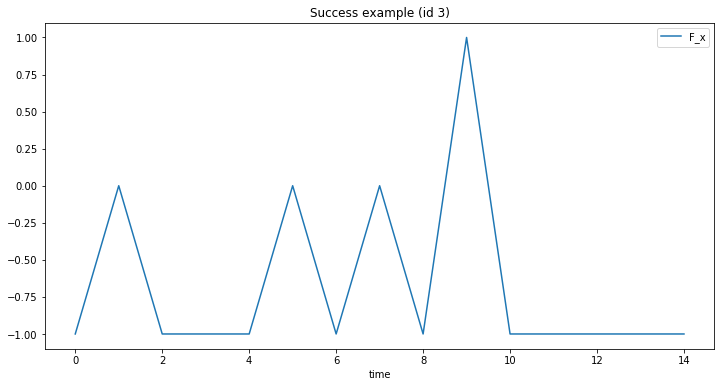

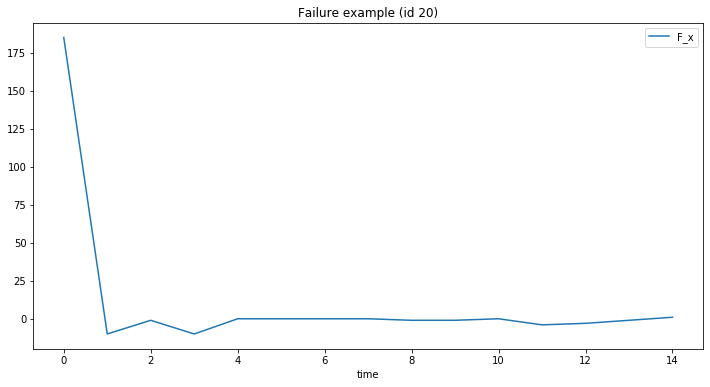

In [21]:
df[df.id == 3][['time', 'F_x']].plot(x='time', title='Success example (id 3)', figsize=(12, 6));
df[df.id == 20][['time', 'F_x']].plot(x='time', title='Failure example (id 20)', figsize=(12, 6));

In [22]:
extraction_settings = ComprehensiveFCParameters()

In [23]:
X = extract_features(df, 
                     column_id='id', column_sort='time',
                     default_fc_parameters=extraction_settings,
                     impute_function= impute)

Feature Extraction: 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]
 'F_x__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"slope"'
 'F_x__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"stderr"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"intercept"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"slope"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"stderr"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"intercept"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"slope"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"stderr"'
 'F_x__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"intercept"'
 'F_x__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"var"__chunk_len_50_

In [24]:
X.head()

variable,F_x__abs_energy,F_x__absolute_sum_of_changes,"F_x__agg_autocorrelation__f_agg_""mean""__maxlag_40","F_x__agg_autocorrelation__f_agg_""median""__maxlag_40","F_x__agg_autocorrelation__f_agg_""var""__maxlag_40","F_x__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""","F_x__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""rvalue""","F_x__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""slope""","F_x__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""stderr""","F_x__agg_linear_trend__f_agg_""max""__chunk_len_50__attr_""intercept""",...,F_x__symmetry_looking__r_0.9,F_x__symmetry_looking__r_0.9500000000000001,F_x__time_reversal_asymmetry_statistic__lag_1,F_x__time_reversal_asymmetry_statistic__lag_2,F_x__time_reversal_asymmetry_statistic__lag_3,F_x__value_count__value_-1,F_x__value_count__value_0,F_x__value_count__value_1,F_x__variance,F_x__variance_larger_than_standard_deviation
id,,,,,,,,,,,,,,,,,,,,,
1,14.0,2.0,-0.106351,-7.206633e-02,0.016879,0.0,-1.0,-1.0,0.0,0.0,...,1.0,1.0,-0.076923,-0.090909,-0.111111,14.0,1.0,0.0,0.062222,0.0
2,25.0,14.0,-0.039098,-4.935275e-02,0.088790,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.000000,0.545455,0.222222,7.0,6.0,0.0,0.915556,0.0
3,12.0,10.0,-0.029815,2.602085e-17,0.105435,1.0,-1.0,-2.0,0.0,0.0,...,1.0,1.0,-0.076923,0.090909,-0.222222,11.0,3.0,1.0,0.355556,0.0
4,16.0,17.0,-0.049773,-6.417112e-02,0.143580,1.0,-1.0,-1.0,0.0,0.0,...,1.0,1.0,0.153846,0.727273,0.333333,5.0,5.0,3.0,0.906667,0.0
5,17.0,13.0,-0.061467,-5.172414e-02,0.052642,2.0,-1.0,-2.0,0.0,0.0,...,1.0,1.0,-0.538462,0.090909,-1.777778,9.0,4.0,0.0,0.773333,0.0


In [25]:
X_filtered = extract_relevant_features(df, y, 
                                       column_id='id', column_sort='time', 
                                       default_fc_parameters=extraction_settings)

Feature Extraction: 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]
 'F_x__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"slope"'
 'F_x__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"stderr"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"intercept"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"slope"'
 'F_x__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"stderr"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"intercept"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"slope"'
 'F_x__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"stderr"'
 'F_x__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"intercept"'
 'F_x__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"rvalue"'
 'F_x__agg_linear_trend__f_agg_"var"__chunk_len_50_

In [26]:
X_filtered.head()

variable,F_x__value_count__value_-1,F_x__abs_energy,F_x__range_count__max_1__min_-1,"F_x__fft_coefficient__coeff_1__attr_""abs""",F_x__variance,F_x__standard_deviation,F_x__ratio_value_number_to_time_series_length,F_x__cid_ce__normalize_True,F_x__partial_autocorrelation__lag_1,F_x__autocorrelation__lag_1,...,"F_x__agg_linear_trend__f_agg_""var""__chunk_len_10__attr_""slope""","F_x__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.4",F_x__autocorrelation__lag_2,"F_x__fft_aggregated__aggtype_""centroid""","F_x__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""",F_x__count_below_mean,F_x__ar_coefficient__k_10__coeff_1,F_x__quantile__q_0.2,F_x__energy_ratio_by_chunks__num_segments_10__segment_focus_4,F_x__quantile__q_0.9
id,,,,,,,,,,,,,,,,,,,,,
1,14.0,14.0,15.0,1.000000,0.062222,0.249444,0.133333,5.669467,-0.081633,-0.081633,...,-0.09,0.000000,-0.010989,1.333333,0.0,14.0,0.125000,-1.0,0.142857,-1.0
2,7.0,25.0,13.0,0.624118,0.915556,0.956847,0.200000,5.724246,-0.100208,-0.100208,...,0.15,0.000000,-0.434279,2.760761,0.0,9.0,-0.078829,-1.0,0.000000,0.0
3,11.0,12.0,14.0,2.203858,0.355556,0.596285,0.200000,6.274950,-0.357143,-0.357143,...,-0.45,0.000000,0.312500,2.614065,1.0,11.0,0.084836,-1.0,0.166667,0.0
4,5.0,16.0,10.0,0.844394,0.906667,0.952190,0.266667,6.213127,-0.327731,-0.327731,...,-1.00,0.571429,-0.451357,3.489022,1.0,7.0,0.003108,-1.0,0.312500,1.0
5,9.0,17.0,13.0,2.730599,0.773333,0.879394,0.266667,5.211063,0.077586,0.077586,...,-0.89,0.000000,-0.131300,2.678754,2.0,10.0,0.087906,-1.0,0.058824,0.0


In [27]:
X_train, X_test, X_filtered_train, X_filtered_test, y_train, y_test = train_test_split(X, X_filtered, y, test_size=.4)

In [28]:
cl = DecisionTreeClassifier()
cl.fit(X_train, y_train)
print(classification_report(y_test, cl.predict(X_test)))

              precision    recall  f1-score   support

       False       0.96      1.00      0.98        25
        True       1.00      0.91      0.95        11

    accuracy                           0.97        36
   macro avg       0.98      0.95      0.97        36
weighted avg       0.97      0.97      0.97        36



In [29]:
cl.n_features_

794

In [30]:
cl2 = DecisionTreeClassifier()
cl2.fit(X_filtered_train, y_train)
print(classification_report(y_test, cl2.predict(X_filtered_test)))

              precision    recall  f1-score   support

       False       0.96      1.00      0.98        25
        True       1.00      0.91      0.95        11

    accuracy                           0.97        36
   macro avg       0.98      0.95      0.97        36
weighted avg       0.97      0.97      0.97        36



In [31]:
cl2.n_features_

101

# classifier

In [32]:
dataframes = [{'data':df_norm, 'y_value':False}, {'data':df_tamper, 'y_value':True}, {'data':df_dup, 'y_value':True}]
y_store = []
df_store = []
sample_id = 0
for df_i in range(len(dataframes)):
    y_val = dataframes[df_i]['y_value']
    for chunk in np.split(np.array(getPacketSpeeds(dataframes[df_i]['data'])), 4):
        y_store.append(y_val)
        for chunk_i in range(len(chunk)):
            df_store.append({'id':sample_id, 'time':chunk_i, 'val':chunk[chunk_i]})
        sample_id += 1

df = pd.DataFrame(df_store)
y = pd.Series(y_store)

In [33]:
df

,id,time,val
0,0,0,241
1,0,1,238
2,0,2,247
3,0,3,233
4,0,4,266
5,0,5,248
6,0,6,235
7,0,7,257
8,0,8,263
9,0,9,254


In [34]:
y

0     False
1     False
2     False
3     False
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
dtype: bool

In [35]:
extraction_settings = ComprehensiveFCParameters()

In [36]:
X = extract_features(df, 
                     column_id='id', column_sort='time',
                     default_fc_parameters=extraction_settings,
                     impute_function= impute)

Feature Extraction: 100%|██████████| 6/6 [00:01<00:00,  5.31it/s]
 'val__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"slope"'
 'val__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"stderr"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"intercept"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"slope"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"stderr"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"intercept"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"slope"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"stderr"'
 'val__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"intercept"'
 'val__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"var"__chunk_len_50__a

In [37]:
X.head()

variable,val__abs_energy,val__absolute_sum_of_changes,"val__agg_autocorrelation__f_agg_""mean""__maxlag_40","val__agg_autocorrelation__f_agg_""median""__maxlag_40","val__agg_autocorrelation__f_agg_""var""__maxlag_40","val__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""","val__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""rvalue""","val__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""slope""","val__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""stderr""","val__agg_linear_trend__f_agg_""max""__chunk_len_50__attr_""intercept""",...,val__symmetry_looking__r_0.9,val__symmetry_looking__r_0.9500000000000001,val__time_reversal_asymmetry_statistic__lag_1,val__time_reversal_asymmetry_statistic__lag_2,val__time_reversal_asymmetry_statistic__lag_3,val__value_count__value_-1,val__value_count__value_0,val__value_count__value_1,val__variance,val__variance_larger_than_standard_deviation
id,,,,,,,,,,,,,,,,,,,,,
0,992021.0,198.0,-0.311604,-0.208244,0.304051,266.0,1.0,26.0,0.0,0.0,...,1.0,1.0,7.350031e+05,1.854065e+06,2.176770e+06,0.0,0.0,0.0,291.173333,1.0
1,878249.0,296.0,-0.181430,-0.103300,0.372485,274.0,1.0,28.0,0.0,0.0,...,1.0,1.0,9.807849e+05,6.305339e+05,1.734595e+06,0.0,0.0,0.0,597.395556,1.0
2,1725371.0,1143.0,-0.038757,-0.119502,0.042290,581.0,1.0,116.0,0.0,0.0,...,1.0,1.0,2.218678e+06,7.302745e+05,1.931885e+07,0.0,0.0,0.0,17222.595556,1.0
3,5604705.0,2964.0,-0.040428,-0.130010,0.043147,1408.0,1.0,247.0,0.0,0.0,...,1.0,1.0,2.609028e+07,3.447817e+06,1.349175e+08,0.0,0.0,0.0,189033.555556,1.0
4,3067525.0,2045.0,-0.036244,-0.119211,0.059954,947.0,-1.0,-635.0,0.0,0.0,...,1.0,1.0,6.126696e+06,-1.473103e+07,-4.796326e+07,0.0,0.0,0.0,36456.328889,1.0


In [38]:
X_filtered = extract_relevant_features(df, y, 
                                       column_id='id', column_sort='time',
                                       default_fc_parameters=extraction_settings)

Feature Extraction: 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]
 'val__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"slope"'
 'val__agg_linear_trend__f_agg_"max"__chunk_len_50__attr_"stderr"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"intercept"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"slope"'
 'val__agg_linear_trend__f_agg_"mean"__chunk_len_50__attr_"stderr"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"intercept"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"slope"'
 'val__agg_linear_trend__f_agg_"min"__chunk_len_50__attr_"stderr"'
 'val__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"intercept"'
 'val__agg_linear_trend__f_agg_"var"__chunk_len_50__attr_"rvalue"'
 'val__agg_linear_trend__f_agg_"var"__chunk_len_50__a

In [39]:
X_filtered.head()

variable
id
0
1
2
3
4


In [40]:
X_train, X_test, X_filtered_train, X_filtered_test, y_train, y_test = train_test_split(X, X_filtered, y, test_size=.4)

In [41]:
cl = DecisionTreeClassifier()
cl.fit(X_train, y_train)
print(classification_report(y_test, cl.predict(X_test)))

              precision    recall  f1-score   support

       False       0.50      1.00      0.67         1
        True       1.00      0.75      0.86         4

    accuracy                           0.80         5
   macro avg       0.75      0.88      0.76         5
weighted avg       0.90      0.80      0.82         5



In [42]:
cl.n_features_

794

In [43]:
cl2 = DecisionTreeClassifier()
cl2.fit(X_filtered_train, y_train)
print(classification_report(y_test, cl2.predict(X_filtered_test)))

ValueError: Found array with 0 feature(s) (shape=(7, 0)) while a minimum of 1 is required.

In [53]:
cl3 = GaussianNB()
cl3.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [58]:
print(classification_report(y_test, cl3.predict(X_test)))

              precision    recall  f1-score   support

       False       1.00      1.00      1.00         1
        True       1.00      1.00      1.00         4

    accuracy                           1.00         5
   macro avg       1.00      1.00      1.00         5
weighted avg       1.00      1.00      1.00         5



In [65]:
cl4 = LinearSVC(max_iter=100000, tol = 1e-10)
cl4.fit(X_train, y_train)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=100000,
          multi_class='ovr', penalty='l2', random_state=None, tol=1e-10,
          verbose=0)

In [62]:
print(classification_report(y_test, cl4.predict(X_test)))

              precision    recall  f1-score   support

       False       0.20      1.00      0.33         1
        True       0.00      0.00      0.00         4

    accuracy                           0.20         5
   macro avg       0.10      0.50      0.17         5
weighted avg       0.04      0.20      0.07         5



/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

